In [4]:
import numpy as np
import pandas as pd
from collections import OrderedDict
import torch
from torch import nn, optim
from torchvision import datasets, transforms, utils, models
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image

plt.rcParams.update({'axes.grid': False})

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device.type}")

Using device: cuda


5760

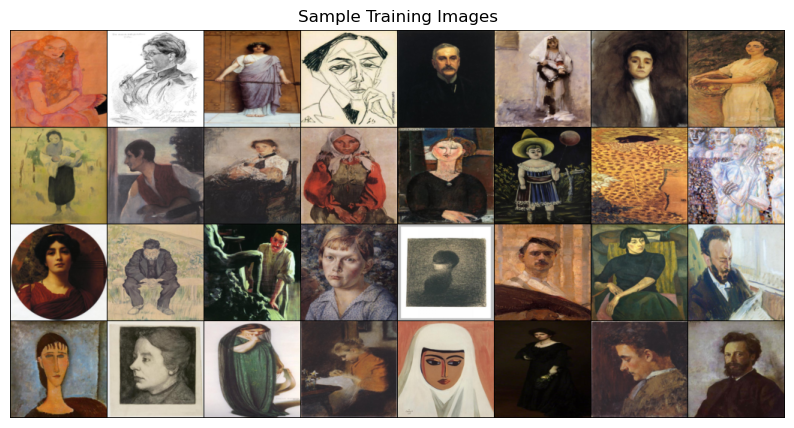

In [6]:
DATA_DIR = "/kaggle/input/portrait-paintings"

IMAGE_SIZE = (128, 128)
BATCH_SIZE = 32

data_transforms = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = datasets.ImageFolder(root=DATA_DIR, transform=data_transforms)

data_loader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

sample_batch = next(iter(data_loader))
plt.figure(figsize=(10, 8)); plt.axis("off"); plt.title("Sample Training Images")
plt.imshow(np.transpose(utils.make_grid(sample_batch[0], padding=1, normalize=True), (1, 2, 0)));

len(data_loader) * BATCH_SIZE

In [7]:
class Generator(nn.Module):
    
    def __init__(self, LATENT_SIZE):
        super(Generator, self).__init__()
        
        self.main = nn.Sequential(
            
            nn.ConvTranspose2d(LATENT_SIZE, 1024, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(1024, 1024, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),


            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(3),
            
            nn.Tanh()
        )
        
    def forward(self, input):
        output = self.main(input)
        return output

In [8]:
class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.main = nn.Sequential(
            
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),


            nn.Conv2d(64, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 1, kernel_size=4, stride=1, padding=0),

            nn.Flatten(),

            nn.Sigmoid()
        )

    def forward(self, input):
        output = self.main(input)
        return output

In [9]:
def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [10]:
LATENT_SIZE = 50
LR = 0.001

generator = Generator(LATENT_SIZE)
generator.apply(weights_init)
generator.to(device)
discriminator = Discriminator()
discriminator.apply(weights_init)
discriminator.to(device);

criterion = nn.BCELoss()
optimizerG = optim.Adam(generator.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerD = optim.Adam(discriminator.parameters(), lr=LR, betas=(0.5, 0.999))
fixed_noise = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=device)  # Fixed noise vector we'll use to track image generation evolution

In [11]:
# Lists to keep track of progress
img_list = []

D_real_epoch, D_fake_epoch, loss_dis_epoch, loss_gen_epoch = [], [], [], []

In [12]:
from statistics import mean

NUM_EPOCHS = 200

print('Training started:\n')

for epoch in range(NUM_EPOCHS):
    
    D_real_iter, D_fake_iter, loss_dis_iter, loss_gen_iter = [], [], [], []
    
    for real_batch, _ in data_loader:

        discriminator.zero_grad()
        
        real_batch = real_batch.to(device)
        real_labels = torch.ones((real_batch.shape[0],), dtype=torch.float).to(device)
        
        output = discriminator(real_batch).view(-1)
        loss_real = criterion(output, real_labels)
        
        D_real_iter.append(output.mean().item())
        
        noise = torch.randn(real_batch.shape[0], LATENT_SIZE, 1, 1).to(device)
        
        fake_batch = generator(noise)
        fake_labels = torch.zeros_like(real_labels)
        
        output = discriminator(fake_batch.detach()).view(-1)
        loss_fake = criterion(output, fake_labels)
    
        loss_dis = loss_real + loss_fake
        loss_dis.backward()
        optimizerD.step()
        
        loss_dis_iter.append(loss_dis.mean().item())
        D_fake_iter.append(output.mean().item())
        
        generator.zero_grad()
        output = discriminator(fake_batch).view(-1)
        loss_gen = criterion(output, real_labels)
        loss_gen.backward()
        
        loss_gen_iter.append(loss_gen.mean().item())
        
        optimizerG.step()
        
    print(f"Epoch ({epoch + 1}/{NUM_EPOCHS})\t",
          f"Loss_G: {mean(loss_gen_iter):.4f}",
          f"Loss_D: {mean(loss_dis_iter):.4f}\t",
          f"D_real: {mean(D_real_iter):.4f}",
          f"D_fake: {mean(D_fake_iter):.4f}")
    
    loss_gen_epoch.append(mean(loss_gen_iter))
    loss_dis_epoch.append(mean(loss_dis_iter))
    D_real_epoch.append(mean(D_real_iter))
    D_fake_epoch.append(mean(D_fake_iter))
    
    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
        img_list.append(utils.make_grid(fake_images, normalize=True, nrows=10))
        
print("\nTraining ended.")

Training started:

Epoch (1/200)	 Loss_G: 2.9272 Loss_D: 0.8347	 D_real: 0.7899 D_fake: 0.2669
Epoch (2/200)	 Loss_G: 1.3967 Loss_D: 1.2552	 D_real: 0.5604 D_fake: 0.4347
Epoch (3/200)	 Loss_G: 1.4359 Loss_D: 1.2683	 D_real: 0.5544 D_fake: 0.4349
Epoch (4/200)	 Loss_G: 1.3638 Loss_D: 1.2387	 D_real: 0.5683 D_fake: 0.4294
Epoch (5/200)	 Loss_G: 1.6838 Loss_D: 1.1519	 D_real: 0.6021 D_fake: 0.3968
Epoch (6/200)	 Loss_G: 1.8438 Loss_D: 1.1536	 D_real: 0.6100 D_fake: 0.3882
Epoch (7/200)	 Loss_G: 1.9650 Loss_D: 1.1179	 D_real: 0.6211 D_fake: 0.3750
Epoch (8/200)	 Loss_G: 2.0399 Loss_D: 1.1210	 D_real: 0.6218 D_fake: 0.3774
Epoch (9/200)	 Loss_G: 1.8552 Loss_D: 1.1452	 D_real: 0.6129 D_fake: 0.3854
Epoch (10/200)	 Loss_G: 1.7214 Loss_D: 1.1932	 D_real: 0.5926 D_fake: 0.4004
Epoch (11/200)	 Loss_G: 1.7173 Loss_D: 1.1875	 D_real: 0.5929 D_fake: 0.4034
Epoch (12/200)	 Loss_G: 1.4273 Loss_D: 1.2454	 D_real: 0.5672 D_fake: 0.4311
Epoch (13/200)	 Loss_G: 1.5346 Loss_D: 1.2355	 D_real: 0.5724 D_fa

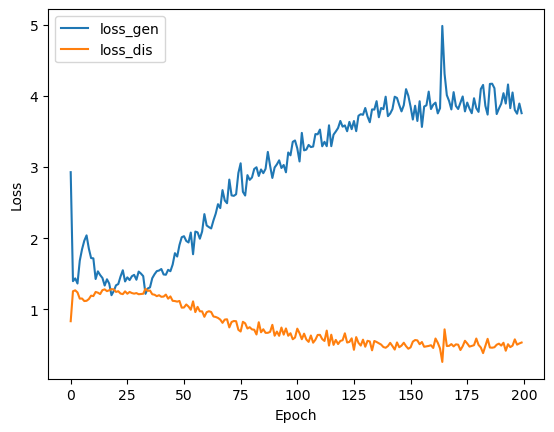

In [13]:
plt.plot(np.array(loss_gen_epoch), label='loss_gen')
plt.plot(np.array(loss_dis_epoch), label='loss_dis')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend();

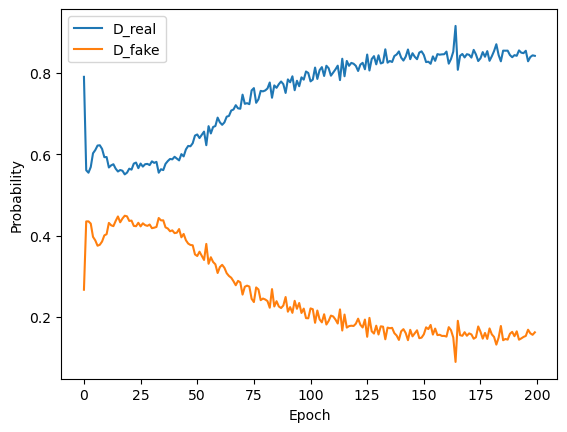

In [14]:
plt.plot(np.array(D_real_epoch), label='D_real')
plt.plot(np.array(D_fake_epoch), label='D_fake')
plt.xlabel("Epoch")
plt.ylabel("Probability")
plt.legend();

In [15]:
%%capture

fig = plt.figure(figsize=(10, 10))
ims = [[plt.imshow(np.transpose(i,(1, 2, 0)), animated=True)] for i in img_list[::10]]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=2000, blit=True)
ani.save('GAN.gif', writer='imagemagick', fps=2)

In [16]:
HTML(ani.to_jshtml())